In [40]:
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path
import time
def plot_boxes(img_rgb, boxes, labels, scores, print_preds_times = False):
    font = cv2.FONT_HERSHEY_SIMPLEX
    start = time.time()
    # Putting the boxes and labels on the image
    for (xmin, ymin, xmax, ymax), label, score in zip(boxes, labels, scores):
        # print((ymin, xmin, ymax, xmax), label)
        img_boxes = cv2.rectangle(img_rgb,(xmin, ymax),(xmax, ymin),(0,255,0), 2)
        cv2.putText(img_boxes, thing_classes[label] + '-' + str(score), (xmin, ymax-10), font, 2, (255,0,0), 2, cv2.LINE_AA)
    end = time.time()
    if print_preds_times:
        print(f'total plotting time: {round(end-start, 2)}s')

    return img_rgb
    
from fsdet.engine import DefaultPredictor
from fsdet.config import get_cfg
cfg = get_cfg()
config_file = '/Users/hariharan/hari_works/grocery-object-detection/ocr/demo/few_shot/configs/Grocery-detection/faster_rcnn_R101_FPN_ft_all.yaml'
cfg.merge_from_file(config_file)
cfg.MODEL.DEVICE = 'cpu'

predictor = DefaultPredictor(cfg)

thing_classes = [ # all classes
        "3roses_top_star",
        "dettol_250ml",
        "dettol_500ml",
        "guntur_chilli",
        "hamam_100g",
        "maha_jyothi",
        "moong_dhal",
        "nescafe_classic",
        "nescafe_sunrise",
        "super_shine",
        "vim_soap"
    ]

froze backbone parameters
froze proposal generator parameters
froze roi_box_head parameters


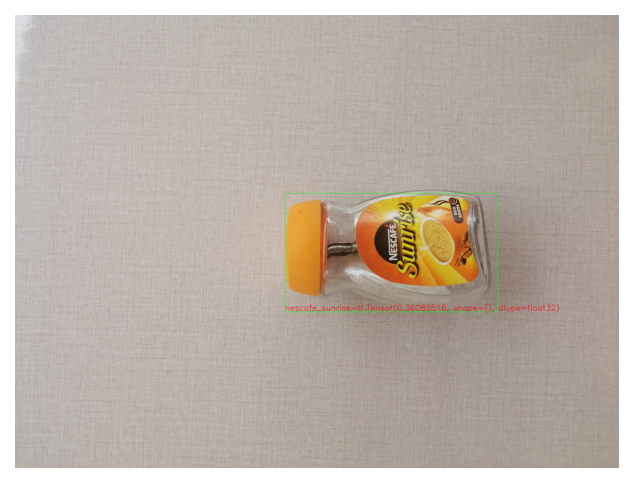

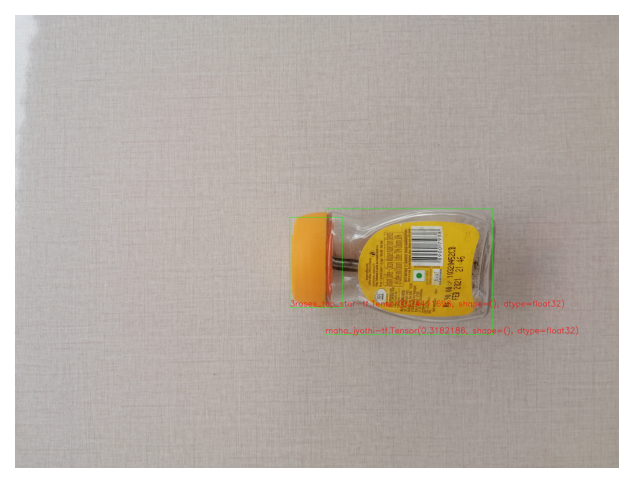

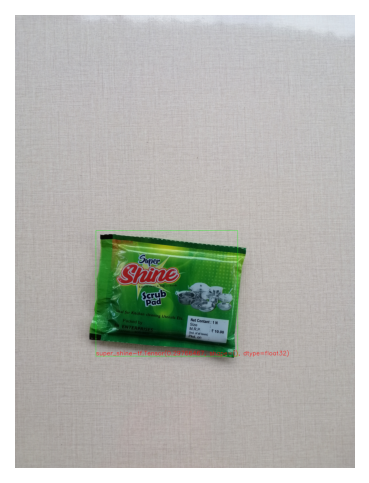

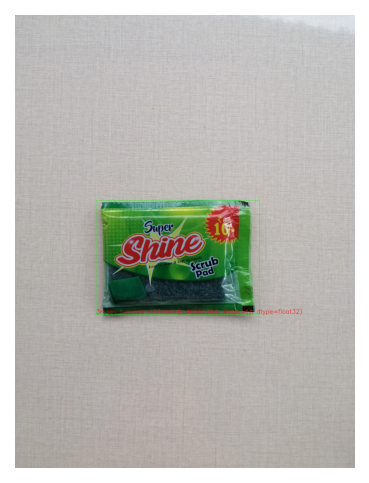

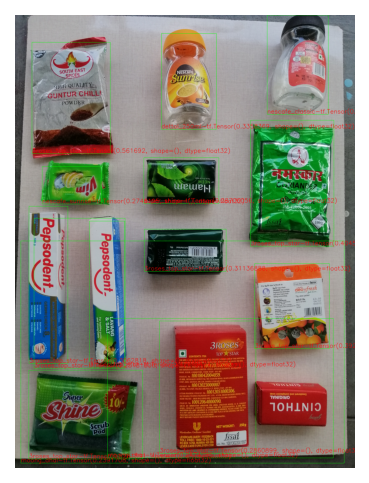

...

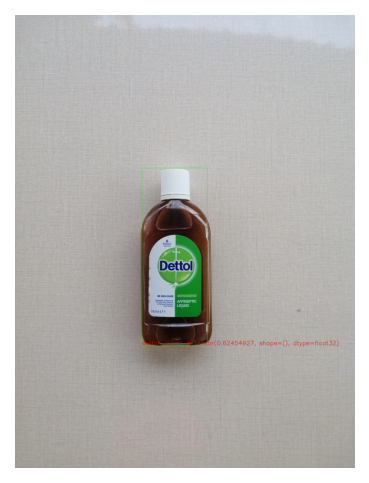

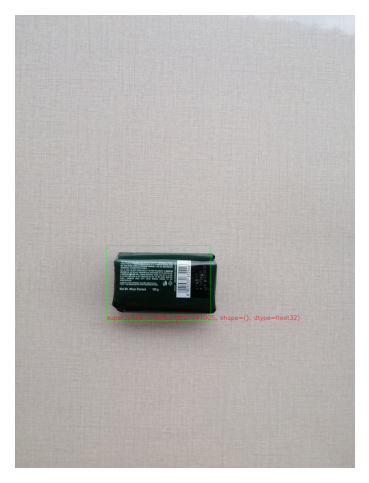

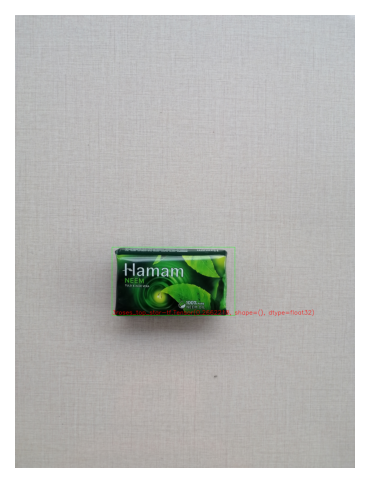

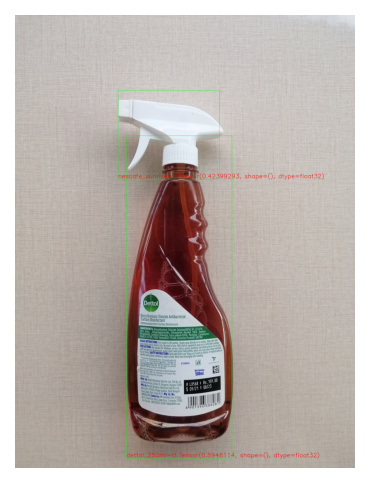

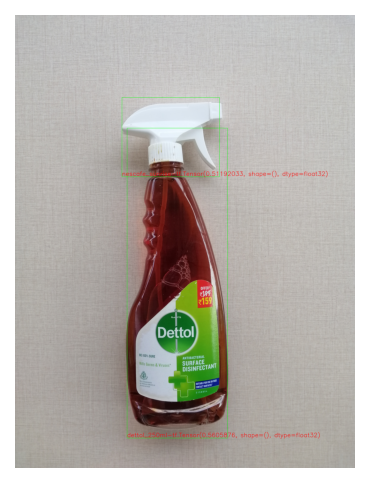

In [41]:
for img_file in Path('/Users/hariharan/hari_works/grocery-object-detection/ocr/demo/grocery-db').rglob('*.jpg'):
    # for img_file = '/Users/hariharan/hari_works/grocery-object-detection/ocr/demo/grocery-db/3roses_top_star/IMG_20220214_161852.jpg'
    img = cv2.imread(str(img_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pred = predictor(img)

    boxes = tf.convert_to_tensor(pred['instances'].pred_boxes.tensor.cpu().numpy(), dtype = tf.float32)
    labels = tf.convert_to_tensor(pred['instances'].pred_classes.cpu().numpy().astype(int), dtype= tf.float32)
    scores = tf.convert_to_tensor(pred['instances'].scores.cpu().numpy().astype(float), dtype = tf.float32)

    selected_indices = tf.image.non_max_suppression(
            boxes = boxes, scores = scores, max_output_size = 100, iou_threshold=0.5,
            score_threshold=0.1, name=None
        )
    selected_boxes = tf.gather(boxes, selected_indices).numpy()
    selected_scores = tf.ga5ther(scores, selected_indices).numpy()
    selected_classes = tf.gather(labels, selected_indices).numpy()

    boxed_img = plot_boxes(img, selected_boxes.astype(int), selected_classes.astype(int), scores)
    plt.figure(dpi = 150)
    plt.axis('off')
    plt.imshow(boxed_img)
    plt.show()

In [17]:
tf.cast(boxes, tf.int32)

<tf.Tensor: shape=(18, 4), dtype=int32, numpy=
array([[1107, 1925, 2086, 3703],
       [1083, 1791, 2091, 3780],
       [ 767, 1916, 2058, 3683],
       [ 797, 1837, 2071, 3761],
       [1211, 2219, 2042, 3784],
       [1348, 2090, 2093, 3831],
       [ 930, 1830, 2015, 3558],
       [1086, 2205, 1871, 3838],
       [1021, 2209, 2033, 3705],
       [1435, 1834, 2050, 3623],
       [1107, 1939, 2196, 3679],
       [ 950, 1654, 2210, 4108],
       [1153, 1970, 2124, 3221],
       [1160, 1954, 2101, 3224],
       [1029, 1764, 2104, 3806],
       [ 781, 1888, 2013, 3741],
       [1391, 2041, 2096, 3861],
       [1263, 1464, 2110, 3329]], dtype=int32)>

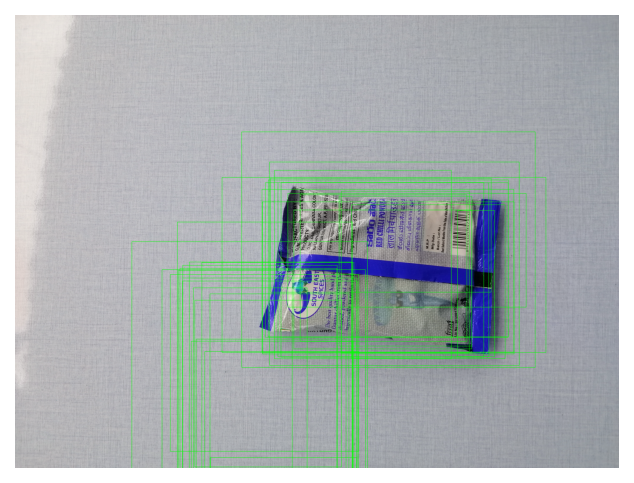